In [1]:
import sys
sys.path.append('../src')

In [2]:
import io
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 

The dataset is codified in latin1

In [3]:
df_raw = pd.read_csv('../data/A-2024/geo_raw_2024_09.csv', encoding='latin1',skiprows=5,nrows = 15)
print(df_raw.columns.tolist())

['Date & Time,"Temperatura interior - ï¿","Mï¿½xima Temperatura Interior - ","Mï¿½nima de Temp Interior - ","Dentro de Hum - %","Mï¿½xima de Hum Interior -","Mï¿½nima de Hum Interior -","Dentro del punto de rocï¿½o - ","Inside Wet Bulb - ï¿","Dentro de ï¿½ndice de calor - ","Dentro de Mï¿½xima ï¿½ndice de calor ","Barï¿½metro - h","Mï¿½xima de Presiï¿½n Atmosfï¿½rica","Mï¿½nima de Presiï¿½n Atmosfï¿½rica","Presiï¿½n Absoluta - h","Temp - ï¿","Temp.ï¿½Alta - ","Temp. Baja - ï¿","Hum - %","Alta Hum - %","Hum Baja - %","Punto de rocï¿½o - ","Mï¿½xima del Punto de Rocï¿½o ","Mï¿½nima del Punto de Rocï¿½o ","Bulbo Hï¿½medo - ","Mï¿½xima Temperatura de Bulbo Hï¿½medo ","Mï¿½nima de la Temperatura de Bulbo Hï¿½medo ","Velocdad del Viento Media - km/h","Prevailing Wind Dir","Avg Wind Dir","Viento Corriente - km","Alta velocidad del viento - km/h","Alta Direcciï¿½n del vien","Viento Frï¿½o - ","Mï¿½nima de la Temperatura de Sensaciï¿½n ","ýndice de calor - ýC","Mï¿½xima del ï¿½ndice de Calor ",

Now we inspect a few rows

In [4]:
with open('../data/A-2024/geo_raw_2024_09.csv', encoding= 'latin1') as f:
    lineas = f.readlines()

lineas_datos = lineas[5:]

lineas_arregladas = []
for i, linea in enumerate(lineas_datos):   #only 10 lines at the moment
    #linea is a string
    print(i,repr(linea))
    linea = linea.rstrip('\n')
    print(i,repr(linea))
    if linea.startswith('"') and linea.endswith('"'):
        linea = linea[1:-1]
    print(i,repr(linea))
    linea = linea.replace('""','"')
    print(i,repr(linea))
    lineas_arregladas.append(linea)

clean_csv = "\n".join(lineas_arregladas)
df = pd.read_csv(io.StringIO(clean_csv))


0 '"Date & Time,""Temperatura interior - ï¿"",""Mï¿½xima Temperatura Interior - "",""Mï¿½nima de Temp Interior - "",""Dentro de Hum - %"",""Mï¿½xima de Hum Interior -"",""Mï¿½nima de Hum Interior -"",""Dentro del punto de rocï¿½o - "",""Inside Wet Bulb - ï¿"",""Dentro de ï¿½ndice de calor - "",""Dentro de Mï¿½xima ï¿½ndice de calor "",""Barï¿½metro - h"",""Mï¿½xima de Presiï¿½n Atmosfï¿½rica"",""Mï¿½nima de Presiï¿½n Atmosfï¿½rica"",""Presiï¿½n Absoluta - h"",""Temp - ï¿"",""Temp.ï¿½Alta - "",""Temp. Baja - ï¿"",""Hum - %"",""Alta Hum - %"",""Hum Baja - %"",""Punto de rocï¿½o - "",""Mï¿½xima del Punto de Rocï¿½o "",""Mï¿½nima del Punto de Rocï¿½o "",""Bulbo Hï¿½medo - "",""Mï¿½xima Temperatura de Bulbo Hï¿½medo "",""Mï¿½nima de la Temperatura de Bulbo Hï¿½medo "",""Velocdad del Viento Media - km/h"",""Prevailing Wind Dir"",""Avg Wind Dir"",""Viento Corriente - km"",""Alta velocidad del viento - km/h"",""Alta Direcciï¿½n del vien"",""Viento Frï¿½o - "",""Mï¿½nima de la Temperatura de Se

In [5]:

#some code to figure out new names 
'''
['Date & Time,"Temperatura interior - ï¿","Mï¿½xima Temperatura Interior - ","Mï¿½nima de Temp Interior - ","Dentro de Hum - %","Mï¿½xima de Hum Interior -","Mï¿½nima de Hum Interior -","Dentro del punto de rocï¿½o - ","Inside Wet Bulb - ï¿","Dentro de ï¿½ndice de calor - ","Dentro de Mï¿½xima ï¿½ndice de calor ","Barï¿½metro - h","Mï¿½xima de Presiï¿½n Atmosfï¿½rica","Mï¿½nima de Presiï¿½n Atmosfï¿½rica","Presiï¿½n Absoluta - h",
                                                                                                                                                                                                                                                            "Temp - ï¿","Temp.ï¿½Alta - ","Temp. Baja - ï¿","Hum - %","Alta Hum - %","Hum Baja - %","Punto de rocï¿½o - ","Mï¿½xima del Punto de Rocï¿½o ","Mï¿½nima del Punto de Rocï¿½o ","Bulbo Hï¿½medo - ","Mï¿½xima Temperatura de Bulbo Hï¿½medo ","Mï¿½nima de la Temperatura de Bulbo Hï¿½medo ",
                                                                                                                                                                                                                                                                                                                                                                                                                                                            "Velocdad del Viento Media - km/h","Prevailing Wind Dir","Avg Wind Dir","Viento Corriente - km","Alta velocidad del viento - km/h","Alta Direcciï¿½n del vien","Viento Frï¿½o - ","Mï¿½nima de la Temperatura de Sensaciï¿½n ","ýndice de calor - ýC",
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            "Mï¿½xima del ï¿½ndice de Calor ","THW Index - ï¿","Mï¿½xima del ï¿½ndice THW ","Mï¿½nima del ï¿½ndice THW ","Lluvia - mm","Mï¿½xima Intensidad de Lluvia - ","Dï¿½as-grado de calentamien","Dï¿½as-grado de enfriamien"']
date_time, inside_temp, max_inside_temp, min_inside_temp, inside_humidity, max_humidity, min_humidity, inside_dew_point, inside_wet_bulb, inside_heat_index, inisde_max_heat_index, barometer, max_atmospheric_pressure, min_atmospheric_pressure, absolute_pressure, temp, high_temp, low_temp, humidity, high_humidity,low_humidity, dew_point, max_dew_point, min_dew_point, humid_bulb, max_temperature_humid_bulb, min_temp_humid_bulb, avg_windspeed, prevailing_wind_direction, avg_wind_direction, ?? viento correinte? , high_windspeed_km_h, high_windspeed_direction, cold_wind, min_temp_sensation, heat_index, min_heat_index, twh_index, max_twh_index, min_twh_index, rain_mm, min_rain_intensity, days_heat_index, days_cold_index]
'''

'\n[\'Date & Time,"Temperatura interior - ï¿","Mï¿½xima Temperatura Interior - ","Mï¿½nima de Temp Interior - ","Dentro de Hum - %","Mï¿½xima de Hum Interior -","Mï¿½nima de Hum Interior -","Dentro del punto de rocï¿½o - ","Inside Wet Bulb - ï¿","Dentro de ï¿½ndice de calor - ","Dentro de Mï¿½xima ï¿½ndice de calor ","Barï¿½metro - h","Mï¿½xima de Presiï¿½n Atmosfï¿½rica","Mï¿½nima de Presiï¿½n Atmosfï¿½rica","Presiï¿½n Absoluta - h",\n                                                                                                                                                                                                                                                            "Temp - ï¿","Temp.ï¿½Alta - ","Temp. Baja - ï¿","Hum - %","Alta Hum - %","Hum Baja - %","Punto de rocï¿½o - ","Mï¿½xima del Punto de Rocï¿½o ","Mï¿½nima del Punto de Rocï¿½o ","Bulbo Hï¿½medo - ","Mï¿½xima Temperatura de Bulbo Hï¿½medo ","Mï¿½nima de la Temperatura de Bulbo Hï¿½medo ",\n                    

| # | Original Name | New name |
|---:|---|---|
| 1 | `Date & Time` | `date_time` |
| 2 | `Temperatura interior - ï¿` | `inside_temp` |
| 3 | `Mï¿½xima Temperatura Interior - ` | `max_inside_temp` |
| 4 | `Mï¿½nima de Temp Interior - ` | `min_inside_temp` |
| 5 | `Dentro de Hum - %` | `inside_humidity` |
| 6 | `Mï¿½xima de Hum Interior -` | `max_inside_humidity` |
| 7 | `Mï¿½nima de Hum Interior -` | `min_inside_humidity` |
| 8 | `Dentro del punto de rocï¿½o - ` | `inside_dew_point` |
| 9 | `Inside Wet Bulb - ï¿` | `inside_wet_bulb` |
| 10 | `Dentro de ï¿½ndice de calor - ` | `inside_heat_index` |
| 11 | `Dentro de Mï¿½xima ï¿½ndice de calor ` | `max_inside_heat_index` |
| 12 | `Barï¿½metro - h` | `barometer` |
| 13 | `Mï¿½xima de Presiï¿½n Atmosfï¿½rica` | `max_atmospheric_pressure` |
| 14 | `Mï¿½nima de Presiï¿½n Atmosfï¿½rica` | `min_atmospheric_pressure` |
| 15 | `Presiï¿½n Absoluta - h` | `absolute_pressure` |
| 16 | `Temp - ï¿` | `outside_temp` |
| 17 | `Temp.ï¿½Alta - ` | `max_outside_temp` |
| 18 | `Temp. Baja - ï¿` | `min_outside_temp` |
| 19 | `Hum - %` | `outside_humidity` |
| 20 | `Alta Hum - %` | `max_outside_humidity` |
| 21 | `Hum Baja - %` | `min_outside_humidity` |
| 22 | `Punto de rocï¿½o - ` | `dew_point` |
| 23 | `Mï¿½xima del Punto de Rocï¿½o ` | `max_dew_point` |
| 24 | `Mï¿½nima del Punto de Rocï¿½o ` | `min_dew_point` |
| 25 | `Bulbo Hï¿½medo - ` | `wet_bulb` |
| 26 | `Mï¿½xima Temperatura de Bulbo Hï¿½medo ` | `max_wet_bulb` |
| 27 | `Mï¿½nima de la Temperatura de Bulbo Hï¿½medo ` | `min_wet_bulb` |
| 28 | `Velocdad del Viento Media - km/h` | `avg_wind_speed` |
| 29 | `Prevailing Wind Dir` | `prevailing_wind_direction` |
| 30 | `Avg Wind Dir` | `avg_wind_direction` |
| 31 | `Viento Corriente - km` | `wind_run` |
| 32 | `Alta velocidad del viento - km/h` | `max_wind_speed` |
| 33 | `Alta Direcciï¿½n del vien` | `max_wind_direction` |
| 34 | `Viento Frï¿½o - ` | `wind_chill` |
| 35 | `Mï¿½nima de la Temperatura de Sensaciï¿½n ` | `min_wind_chill` |
| 36 | `ýndice de calor - ýC` | `heat_index` |
| 37 | `Mï¿½xima del ï¿½ndice de Calor ` | `max_heat_index` |
| 38 | `THW Index - ï¿` | `thw_index` |
| 39 | `Mï¿½xima del ï¿½ndice THW ` | `max_thw_index` |
| 40 | `Mï¿½nima del ï¿½ndice THW ` | `min_thw_index` |
| 41 | `Lluvia - mm` | `rain_mm` |
| 42 | `Mï¿½xima Intensidad de Lluvia - ` | `max_rain_rate` |
| 43 | `Dï¿½as-grado de calentamien` | `heating_degree_days` |
| 44 | `Dï¿½as-grado de enfriamien` | `cooling_degree_days` |

In [6]:
new_names = [
    "date_time",
    "inside_temp",
    "max_inside_temp",
    "min_inside_temp",
    "inside_humidity",
    "max_inside_humidity",
    "min_inside_humidity",
    "inside_dew_point",
    "inside_wet_bulb",
    "inside_heat_index",
    "max_inside_heat_index",
    "barometer",
    "max_atmospheric_pressure",
    "min_atmospheric_pressure",
    "absolute_pressure",
    "outside_temp",
    "max_outside_temp",
    "min_outside_temp",
    "outside_humidity",
    "max_outside_humidity",
    "min_outside_humidity",
    "dew_point",
    "max_dew_point",
    "min_dew_point",
    "wet_bulb",
    "max_wet_bulb",
    "min_wet_bulb",
    "avg_wind_speed",
    "prevailing_wind_direction",
    "avg_wind_direction",
    "wind_run",
    "max_wind_speed",
    "max_wind_direction",
    "wind_chill",
    "min_wind_chill",
    "heat_index",
    "max_heat_index",
    "thw_index",
    "max_thw_index",
    "min_thw_index",
    "rain_mm",
    "max_rain_rate",
    "heating_degree_days",
    "cooling_degree_days"
]

In [7]:
df.columns = new_names
print(df.columns)

Index(['date_time', 'inside_temp', 'max_inside_temp', 'min_inside_temp',
       'inside_humidity', 'max_inside_humidity', 'min_inside_humidity',
       'inside_dew_point', 'inside_wet_bulb', 'inside_heat_index',
       'max_inside_heat_index', 'barometer', 'max_atmospheric_pressure',
       'min_atmospheric_pressure', 'absolute_pressure', 'outside_temp',
       'max_outside_temp', 'min_outside_temp', 'outside_humidity',
       'max_outside_humidity', 'min_outside_humidity', 'dew_point',
       'max_dew_point', 'min_dew_point', 'wet_bulb', 'max_wet_bulb',
       'min_wet_bulb', 'avg_wind_speed', 'prevailing_wind_direction',
       'avg_wind_direction', 'wind_run', 'max_wind_speed',
       'max_wind_direction', 'wind_chill', 'min_wind_chill', 'heat_index',
       'max_heat_index', 'thw_index', 'max_thw_index', 'min_thw_index',
       'rain_mm', 'max_rain_rate', 'heating_degree_days',
       'cooling_degree_days'],
      dtype='object')


In [8]:
print(df.shape)
df.head()


(8641, 44)


,date_time,inside_temp,max_inside_temp,min_inside_temp,inside_humidity,max_inside_humidity,min_inside_humidity,inside_dew_point,inside_wet_bulb,inside_heat_index,...,min_wind_chill,heat_index,max_heat_index,thw_index,max_thw_index,min_thw_index,rain_mm,max_rain_rate,heating_degree_days,cooling_degree_days
0,1/9/24 00:00,"29,7","29,8","29,7","37,3","37,4","37,3","13,6","19,2","29,1",...,"21,5","21,8","21,9","21,8","21,9","21,8","0,0","0,0","0,000","0,011"
1,1/9/24 00:05,"29,7","29,8","29,7","37,3","37,4","37,3","13,6","19,2","29,1",...,"21,5","21,8","21,8","21,8","21,8","21,7","0,0","0,0","0,000","0,011"
2,1/9/24 00:10,"29,7","29,7","29,7","37,4","37,4","37,3","13,6","19,2","29,1",...,"21,5","21,7","21,8","21,7","21,8","21,7","0,0","0,0","0,000","0,011"
3,1/9/24 00:15,"29,7","29,7","29,7","37,4","37,4","37,3","13,6","19,1","29,0",...,"21,5","21,8","21,8","21,8","21,8","21,7","0,0","0,0","0,000","0,011"
4,1/9/24 00:20,"29,7","29,7","29,7","37,4","37,4","37,3","13,6","19,1","29,0",...,"21,5","21,7","21,8","21,7","21,8","21,7","0,0","0,0","0,000","0,011"


We have to check the datatypes 

In [9]:
df.dtypes

date_time                    object
inside_temp                  object
max_inside_temp              object
min_inside_temp              object
inside_humidity              object
max_inside_humidity          object
min_inside_humidity          object
inside_dew_point             object
inside_wet_bulb              object
inside_heat_index            object
max_inside_heat_index        object
barometer                    object
max_atmospheric_pressure     object
min_atmospheric_pressure     object
absolute_pressure            object
outside_temp                 object
max_outside_temp             object
min_outside_temp             object
outside_humidity             object
max_outside_humidity         object
min_outside_humidity         object
dew_point                    object
max_dew_point                object
min_dew_point                object
wet_bulb                     object
max_wet_bulb                 object
min_wet_bulb                 object
avg_wind_speed              

In [10]:
df[df=="--"].stack()

196   outside_humidity        --
      max_outside_humidity    --
      min_outside_humidity    --
      dew_point               --
      wet_bulb                --
                              ..
8466  min_outside_humidity    --
      dew_point               --
      wet_bulb                --
      heat_index              --
      thw_index               --
Length: 384, dtype: object

In [11]:
categorical_cols = [
    "date_time",
    "prevailing_wind_direction", 
    "avg_wind_direction",
    "max_wind_direction"
]

numeric_cols = df.columns.drop(categorical_cols)


df[numeric_cols] = (
    df[numeric_cols]
    .replace(",",".", regex =True) # regex does nothing here
    .replace("--",np.nan)
    .astype(float)
)

df.dtypes

date_time                     object
inside_temp                  float64
max_inside_temp              float64
min_inside_temp              float64
inside_humidity              float64
max_inside_humidity          float64
min_inside_humidity          float64
inside_dew_point             float64
inside_wet_bulb              float64
inside_heat_index            float64
max_inside_heat_index        float64
barometer                    float64
max_atmospheric_pressure     float64
min_atmospheric_pressure     float64
absolute_pressure            float64
outside_temp                 float64
max_outside_temp             float64
min_outside_temp             float64
outside_humidity             float64
max_outside_humidity         float64
min_outside_humidity         float64
dew_point                    float64
max_dew_point                float64
min_dew_point                float64
wet_bulb                     float64
max_wet_bulb                 float64
min_wet_bulb                 float64
a

In [12]:
print(df["date_time"])

df["date_time"]= pd.to_datetime(df["date_time"], format="%d/%m/%y %H:%M")

print(df["date_time"])

0        1/9/24 00:00
1        1/9/24 00:05
2        1/9/24 00:10
3        1/9/24 00:15
4        1/9/24 00:20
            ...      
8636    30/9/24 23:40
8637    30/9/24 23:45
8638    30/9/24 23:50
8639    30/9/24 23:55
8640    1/10/24 00:00
Name: date_time, Length: 8641, dtype: object
0      2024-09-01 00:00:00
1      2024-09-01 00:05:00
2      2024-09-01 00:10:00
3      2024-09-01 00:15:00
4      2024-09-01 00:20:00
               ...        
8636   2024-09-30 23:40:00
8637   2024-09-30 23:45:00
8638   2024-09-30 23:50:00
8639   2024-09-30 23:55:00
8640   2024-10-01 00:00:00
Name: date_time, Length: 8641, dtype: datetime64[ns]


In [13]:
df.dtypes["date_time"]

dtype('<M8[ns]')

In [14]:
df.to_csv("../data/A-2024/geo_clean.csv", index=False)

In [15]:
df.describe()

,date_time,inside_temp,max_inside_temp,min_inside_temp,inside_humidity,max_inside_humidity,min_inside_humidity,inside_dew_point,inside_wet_bulb,inside_heat_index,...,min_wind_chill,heat_index,max_heat_index,thw_index,max_thw_index,min_thw_index,rain_mm,max_rain_rate,heating_degree_days,cooling_degree_days
count,8641,8641.000000,8641.000000,8641.000000,8641.000000,8641.000000,8641.000000,8641.000000,8641.000000,8641.000000,...,8641.000000,8605.000000,8623.000000,8605.000000,8623.000000,8623.000000,8641.000000,8641.000000,8641.000000,8641.000000
mean,2024-09-16 00:00:00,26.842125,26.887814,26.795753,35.367168,35.441303,35.292512,10.054392,16.523782,25.980870,...,17.512603,17.002626,17.070776,16.923475,17.002992,16.838536,0.000555,0.014605,0.008446,0.006143
min,2024-09-01 00:00:00,21.300000,21.300000,21.300000,18.400000,18.400000,18.100000,1.400000,11.900000,19.900000,...,5.700000,5.800000,5.900000,5.700000,5.900000,5.600000,0.000000,0.000000,0.000000,0.000000
25%,2024-09-08 12:00:00,24.700000,24.700000,24.700000,31.900000,31.900000,31.800000,8.500000,15.200000,23.900000,...,13.800000,13.400000,13.400000,13.300000,13.400000,13.300000,0.000000,0.000000,0.000000,0.000000
50%,2024-09-16 00:00:00,26.300000,26.400000,26.300000,35.500000,35.600000,35.500000,9.900000,16.200000,25.400000,...,16.900000,16.600000,16.600000,16.500000,16.600000,16.400000,0.000000,0.000000,0.004000,0.000000
75%,2024-09-23 12:00:00,28.700000,28.700000,28.700000,38.400000,38.400000,38.300000,11.600000,17.900000,27.800000,...,21.100000,20.300000,20.400000,20.200000,20.300000,20.100000,0.000000,0.000000,0.016000,0.010000
max,2024-10-01 00:00:00,38.400000,38.500000,38.100000,48.500000,48.800000,48.200000,17.000000,22.300000,37.500000,...,30.000000,29.100000,29.100000,29.100000,29.100000,28.900000,1.200000,31.800000,0.043000,0.041000
std,NaN,2.943193,2.961539,2.924565,5.104924,5.102121,5.107142,2.381888,1.862746,2.930451,...,5.015037,4.777318,4.804196,4.813348,4.834504,4.809963,0.017204,0.521709,0.010090,0.009703


In [16]:
df.isna().sum().sort_values(ascending=False)

min_outside_humidity         38
max_outside_humidity         38
outside_humidity             38
wet_bulb                     36
dew_point                    36
thw_index                    36
heat_index                   36
max_wet_bulb                 18
min_dew_point                18
min_wet_bulb                 18
max_dew_point                18
max_heat_index               18
max_thw_index                18
min_thw_index                18
wind_chill                    0
min_wind_chill                0
max_wind_speed                0
wind_run                      0
avg_wind_direction            0
prevailing_wind_direction     0
avg_wind_speed                0
rain_mm                       0
max_rain_rate                 0
heating_degree_days           0
max_wind_direction            0
date_time                     0
inside_temp                   0
min_outside_temp              0
max_inside_temp               0
min_inside_temp               0
inside_humidity               0
max_insi

In [17]:
df[df["outside_humidity"].isna()]["date_time"]

196    2024-09-01 16:20:00
461    2024-09-02 14:25:00
462    2024-09-02 14:30:00
463    2024-09-02 14:35:00
474    2024-09-02 15:30:00
517    2024-09-02 19:05:00
518    2024-09-02 19:10:00
1776   2024-09-07 04:00:00
1777   2024-09-07 04:05:00
1837   2024-09-07 09:05:00
1838   2024-09-07 09:10:00
1839   2024-09-07 09:15:00
1840   2024-09-07 09:20:00
1841   2024-09-07 09:25:00
2523   2024-09-09 18:15:00
2780   2024-09-10 15:40:00
2814   2024-09-10 18:30:00
4413   2024-09-16 07:45:00
4428   2024-09-16 09:00:00
4429   2024-09-16 09:05:00
4430   2024-09-16 09:10:00
4431   2024-09-16 09:15:00
4432   2024-09-16 09:20:00
4717   2024-09-17 09:05:00
4718   2024-09-17 09:10:00
4719   2024-09-17 09:15:00
5007   2024-09-18 09:15:00
5008   2024-09-18 09:20:00
6152   2024-09-22 08:40:00
6153   2024-09-22 08:45:00
6162   2024-09-22 09:30:00
6163   2024-09-22 09:35:00
7764   2024-09-27 23:00:00
7915   2024-09-28 11:35:00
8084   2024-09-29 01:40:00
8427   2024-09-30 06:15:00
8433   2024-09-30 06:45:00
8

In [18]:
cols_to_interpolate = [
    "outside_humidity",
    "min_outside_humidity",
    "max_outside_humidity",
    "wet_bulb",
    "min_wet_bulb",
    "max_wet_bulb",
    "dew_point",
    "min_dew_point",
    "max_dew_point",
    "heat_index",
    "max_heat_index",
    "thw_index",
    "max_thw_index",
    "min_thw_index"
]


for col in cols_to_interpolate:
    df[f"{col}_interpolated"] = df[col].isna()

for col in cols_to_interpolate:
    df[col] = df[col].interpolate()

In [19]:
df[cols_to_interpolate].isna().sum()

outside_humidity        0
min_outside_humidity    0
max_outside_humidity    0
wet_bulb                0
min_wet_bulb            0
max_wet_bulb            0
dew_point               0
min_dew_point           0
max_dew_point           0
heat_index              0
max_heat_index          0
thw_index               0
max_thw_index           0
min_thw_index           0
dtype: int64

Let's calculate the z score to find outliers 

In [20]:

outliers_count = {}

for col in numeric_cols:
    z_scores = (df[col]- df[col].mean())/df[col].std()
    (z_scores.abs()>3).sum() # guarda series
    outliers_count[col]=(z_scores.abs()>3).sum()



In [21]:
outliers_count = pd.DataFrame(outliers_count, index = [0])
outliers_count.T.sort_values(by= 0, ascending= False)

,0
wind_run,156
avg_wind_speed,149
max_wind_speed,105
cooling_degree_days,74
inside_heat_index,45
max_inside_heat_index,44
inside_dew_point,44
max_dew_point,39
heating_degree_days,37
dew_point,37


In [22]:
df["wet_bulb"].std()
df["wet_bulb"].describe()
df["avg_wind_speed"].std()

np.float64(3.6789679309455248)

It makes sense that average wind speed has 149 outliers. This is because we assumed that average wind speed follows a normal distribution, but this isn't the case. Most of the time windspeed is very low but ocasionally there are very fast gusts. 

Wind run has the same problem.

## Visual overview to detect wrong data 

We start with `avg_wind_speed`

To visualize three standard deviations we have: 

z = (x-mean)/std

x = z*std + mean


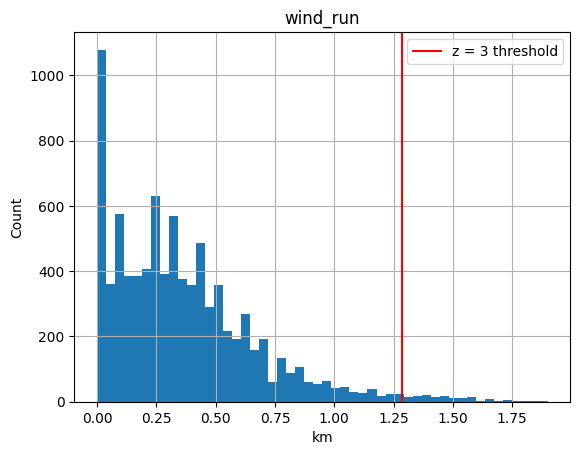

In [23]:

plt.hist(df["wind_run"], bins =50)
plt.axvline(x= 3*df["wind_run"].std()+ df["wind_run"].mean(), color = "red", label = "z = 3 threshold")
plt.title("wind_run")
plt.legend()
plt.xlabel("km")
plt.ylabel("Count")
plt.grid()
plt.show()

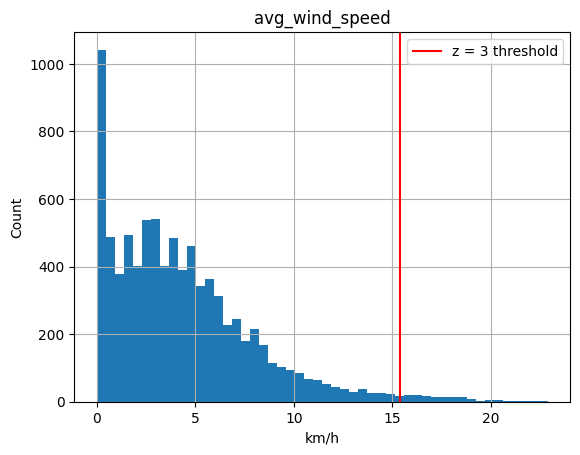

In [24]:
plt.hist(df["avg_wind_speed"], bins =50)
plt.axvline(x= 3*df["avg_wind_speed"].std()+ df["avg_wind_speed"].mean(), color = "red", label = "z = 3 threshold")
plt.title("avg_wind_speed")
plt.legend()
plt.xlabel("km/h")
plt.ylabel("Count")
plt.grid()
plt.show()

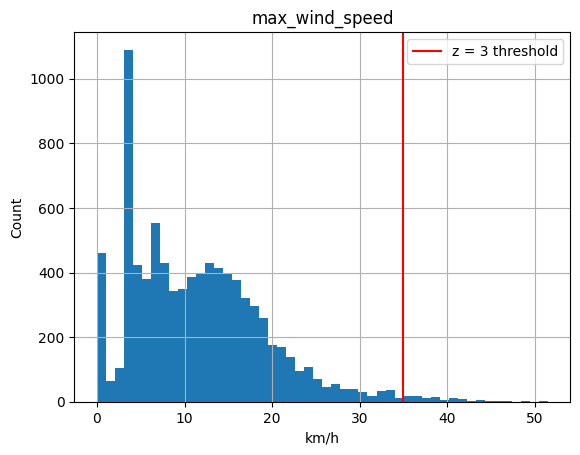

In [25]:
plt.hist(df["max_wind_speed"], bins =50)
plt.axvline(x= 3*df["max_wind_speed"].std()+ df["max_wind_speed"].mean(), color = "red", label = "z = 3 threshold")
plt.title("max_wind_speed")
plt.legend()
plt.xlabel("km/h")
plt.ylabel("Count")
plt.grid()
plt.show()

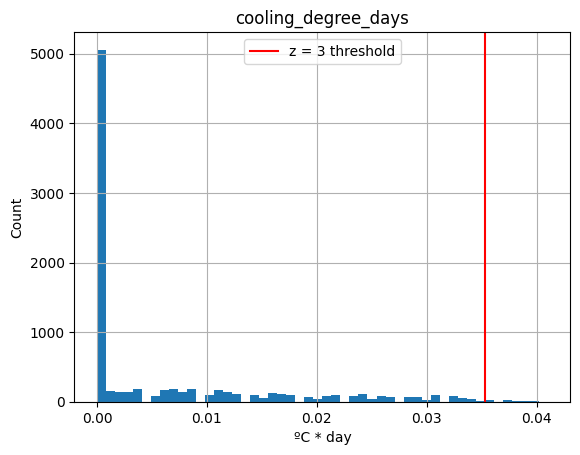

In [26]:
plt.hist(df["cooling_degree_days"], bins =50)
plt.axvline(x= 3*df["cooling_degree_days"].std()+ df["cooling_degree_days"].mean(), color = "red", label = "z = 3 threshold")
plt.title("cooling_degree_days")
plt.legend()
plt.xlabel("ºC * day")
plt.ylabel("Count")
plt.grid()
plt.show()

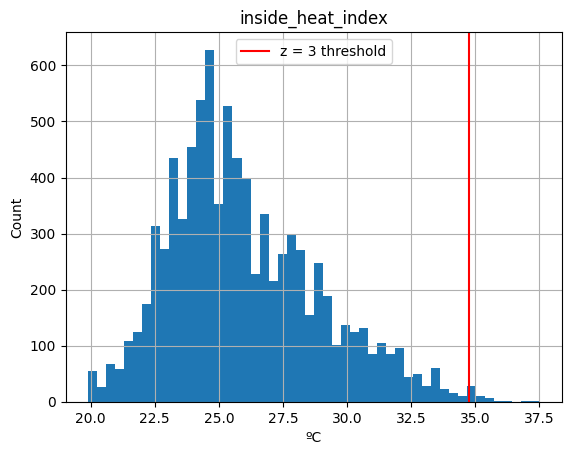

In [27]:
plt.hist(df["inside_heat_index"], bins =50)
plt.axvline(x= 3*df["inside_heat_index"].std()+ df["inside_heat_index"].mean(), color = "red", label = "z = 3 threshold")
plt.title("inside_heat_index")
plt.legend()
plt.xlabel("ºC")
plt.ylabel("Count")
plt.grid()
plt.show()

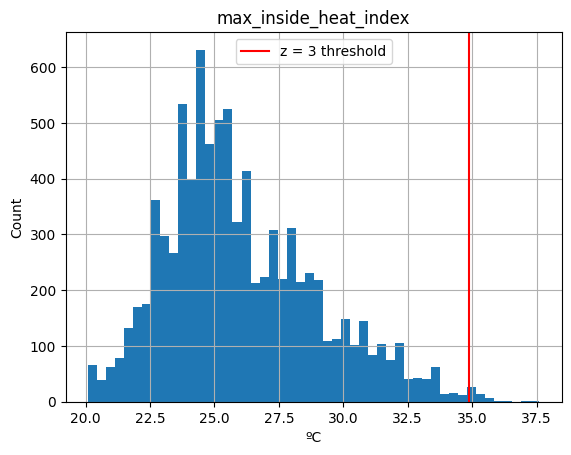

In [28]:
plt.hist(df["max_inside_heat_index"], bins =50)
plt.axvline(x= 3*df["max_inside_heat_index"].std()+ df["max_inside_heat_index"].mean(), color = "red", label = "z = 3 threshold")
plt.title("max_inside_heat_index")
plt.legend()
plt.xlabel("ºC")
plt.ylabel("Count")
plt.grid()
plt.show()

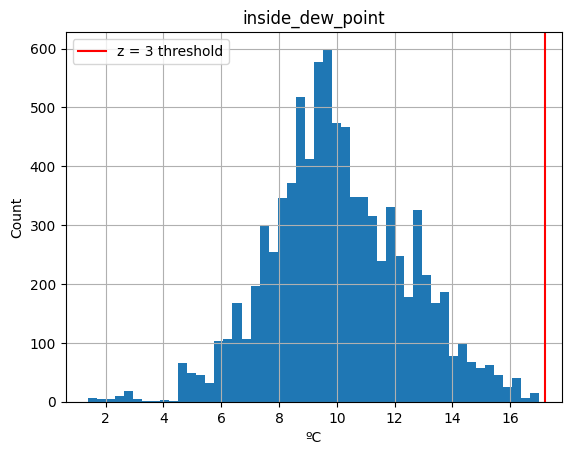

In [29]:
plt.hist(df["inside_dew_point"], bins =50)
plt.axvline(x= 3*df["inside_dew_point"].std()+ df["inside_dew_point"].mean(), color = "red", label = "z = 3 threshold")
plt.title("inside_dew_point")
plt.legend()
plt.xlabel("ºC")
plt.ylabel("Count")
plt.grid()
plt.show()

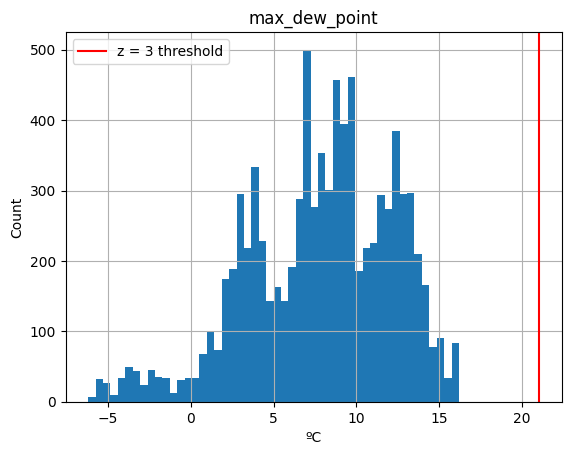

In [30]:
plt.hist(df["max_dew_point"], bins =50)
plt.axvline(x= 3*df["max_dew_point"].std()+ df["max_dew_point"].mean(), color = "red", label = "z = 3 threshold")
plt.title("max_dew_point")
plt.legend()
plt.xlabel("ºC")
plt.ylabel("Count")
plt.grid()
plt.show()

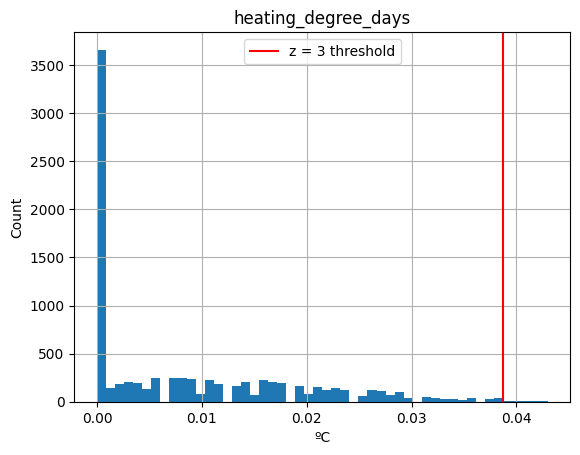

In [31]:
plt.hist(df["heating_degree_days"], bins =50)
plt.axvline(x= 3*df["heating_degree_days"].std()+ df["heating_degree_days"].mean(), color = "red", label = "z = 3 threshold")
plt.title("heating_degree_days")
plt.legend()
plt.xlabel("ºC")
plt.ylabel("Count")
plt.grid()
plt.show()